In [1]:
import math
from math import pi
import numpy as np
import matplotlib.pyplot as plt

import skimage
from skimage import io, measure, exposure, filters
from skimage.color import rgba2rgb, rgb2gray
from sklearn.cluster import KMeans
from skimage.util import compare_images
from skimage.filters.rank import entropy
from skimage.feature import greycomatrix, greycoprops
from skimage.morphology import disk

from scipy.stats import entropy
from skimage.filters import gabor
from skimage import data, io
from matplotlib import pyplot as plt  # doctest: +SKIP
from math import pi

from skimage import filters
from skimage.morphology import disk

import os
import csv

%matplotlib inline

In [3]:
# GLRLM functions

def GLRLM_filter(input_image):
    for i in range(0, 50):
        input_image = filters.median(input_image, disk(1))
    
    return input_image


from itertools import groupby
def getGrayLevelRumatrix(array, theta):
        '''
        calculate GLRLM for the image input
        parameters：
        array: input，image as 2d array
        theta: input，degree used to calculate GLRL matrix, candidate can be['deg0', 'deg45', 'deg90', 'deg135']
        glrlm: output
        '''
        P = array
        rows, cols = P.shape
        min_pixels = np.min(P)   
        run_length = max(rows, cols)   
        num_level = int(np.max(P) - np.min(P) + 1)  

        deg0 = [val.tolist() for sublist in np.vsplit(P, rows) for val in sublist]  

        deg90 = [val.tolist() for sublist in np.split(np.transpose(P), cols) for val in sublist]  
        
        diags = [P[::-1, :].diagonal(i) for i in range(-P.shape[0]+1, P.shape[1])]  
        
        deg45 = [n.tolist() for n in diags]
        Pt = np.rot90(P, 3)   # 135度矩阵统计
        diags = [Pt[::-1, :].diagonal(i) for i in range(-Pt.shape[0]+1, Pt.shape[1])]
        deg135 = [n.tolist() for n in diags]

        def length(l):
            if hasattr(l, '__len__'):
                return np.size(l)
            else:
                i = 0
                for _ in l:
                    i += 1
                return i

        glrlm = np.zeros((num_level, run_length, len(theta)))  
        for angle in theta:
            for splitvec in range(0, len(eval(angle))):
                flattened = eval(angle)[splitvec]
                answer = []
                for key, iter in groupby(flattened):   
                    answer.append((key, length(iter)))   
                for ansIndex in range(0, len(answer)):
                    glrlm[int(answer[ansIndex][0]-min_pixels), int(answer[ansIndex][1]-1), theta.index(angle)] += 1   # 每次将统计像素值减去最小值就可以填入GLRLM矩阵中
        return glrlm
    
    

## feature extraction function

In [95]:
def extract_features(image_input):
    """This function takes an image 512x512 as input, and separate the image into 64 64x64 patches.
    What it returns is a list of feature vectors for each patch, each feature factor contains 
    8 + 6 + 160 + 624 = 798 features"""
    
    # divided into 64 patches
    PATCH_SIZE = 64
    patch_locations = []
    patches = []
    for i in range(0,512,64):
        for j in range(0, 512, 64):
            patch_locations.append( (i,j) )
    
    for loc in patch_locations:
        patches.append(image[loc[0]:loc[0] + PATCH_SIZE,
                               loc[1]:loc[1] + PATCH_SIZE])
    
    vector_list = []
    for patch in patches:  
        
        # extract features from color
        # 8 features
        # header = ["cb1","cb2","cb3","cb4","cb5","cb6","cb7","cb8""]
        gray =  rgb2gray(patch)
        [counts, bins] = exposure.histogram(gray, nbins=8, source_range='dtype', normalize=True)
        v1 = counts.flatten()
        
    
        # extract features from GLCM
        # 6 features
        # header = ['contrast', 'dissimilarity', 'homogeneity', 'ASM', 'energy', 'correlation']
        gray_uint = (255*gray).astype(np.uint8)
        glcm = greycomatrix(gray_uint, distances=[5], angles=[0], levels=256,
                        symmetric=True, normed=True)
    
        v2 = [0, 0, 0, 0, 0, 0]
        v2[0] = greycoprops(glcm, 'contrast')[0, 0]
        v2[1] = greycoprops(glcm, 'dissimilarity')[0, 0]
        v2[2] = greycoprops(glcm, 'homogeneity')[0, 0]
        v2[3] = greycoprops(glcm, 'ASM')[0, 0]
        v2[4] = greycoprops(glcm, 'energy')[0, 0]
        v2[5] = greycoprops(glcm, 'correlation')[0, 0]
    
    
    
    
        # extract featrues from Gabor filters
        # 20 * 2 * 4 = 160 features
        v3 = []
        theta = [pi/6, pi/4, 2*pi/3, 3*pi/4]
        frequency = [0.8, 1]
        # header = ["t_i f_j b_k"] i refers to ith theta, j refers to jth frequency, k refers to kth bin
        for i in range(0, len(theta)):
            for j in range(0, len(frequency)):
                filt_real, filt_imag = gabor(gray, theta = theta[i], frequency=frequency[j])
            
                [counts, bins] = exposure.histogram(filt_real, nbins=20, source_range='dtype',normalize=False)
                v3_ij = counts.flatten()
                v3.extend(v3_ij)
                
    
    
    
        # extract freatures from GLRLM
        # (26 * 6) * 4 = 624 features
        BLACK = 50
        bin_size = 10
        # ["0-10", "11-20", "21-30", "31-40", "41-50", "51-60", "61-70"]
        bins = ("0-10", "11-20", "21-30", "31-40", "41-50", "51-60", "61-70")
        
        processed_patch = GLRLM_filter(gray_uint)


        # 0 degree GLRLM
        # header = ["g_d l_i b_j"], d refers to degree used, i refers to ith length, j refers to jth bin
        # 156 features
        glrlm = getGrayLevelRumatrix(processed_patch, ["deg0"])
        len_2 = [0] * 26
        len_3 = [0] * 26
        len_4 = [0] * 26
        len_5 = [0] * 26
        len_6 = [0] * 26
        len_7 = [0] * 26
        for num in range(0, len(glrlm)):
            bin_num = num // bin_size
            len_2[bin_num] += int(glrlm[num][1])
            len_3[bin_num] += int(glrlm[num][2])
            len_4[bin_num] += int(glrlm[num][3])
            len_5[bin_num] += int(glrlm[num][4])
            len_6[bin_num] += int(glrlm[num][5])
            len_7[bin_num] += int(glrlm[num][6])
        v4 = list()
        v4 = len_2 + len_3 + len_4 + len_5 + len_6 + len_7
        
        
        # 45 degree GLRLM
        # 156 features
        glrlm = getGrayLevelRumatrix(processed_patch, ["deg45"])
        len_2 = [0] * 26
        len_3 = [0] * 26
        len_4 = [0] * 26
        len_5 = [0] * 26
        len_6 = [0] * 26
        len_7 = [0] * 26
        for num in range(0, len(glrlm)):
            bin_num = num // bin_size
            len_2[bin_num] += int(glrlm[num][1])
            len_3[bin_num] += int(glrlm[num][2])
            len_4[bin_num] += int(glrlm[num][3])
            len_5[bin_num] += int(glrlm[num][4])
            len_6[bin_num] += int(glrlm[num][5])
            len_7[bin_num] += int(glrlm[num][6])
        v5 = list()
        v5 = len_2 + len_3 + len_4 + len_5 + len_6 + len_7
        
        
        
        # 90 degree GLRLM
        # 156 features
        glrlm = getGrayLevelRumatrix(processed_patch, ["deg90"])
        len_2 = [0] * 26
        len_3 = [0] * 26
        len_4 = [0] * 26
        len_5 = [0] * 26
        len_6 = [0] * 26
        len_7 = [0] * 26
        for num in range(0, len(glrlm)):
            bin_num = num // bin_size
            len_2[bin_num] += int(glrlm[num][1])
            len_3[bin_num] += int(glrlm[num][2])
            len_4[bin_num] += int(glrlm[num][3])
            len_5[bin_num] += int(glrlm[num][4])
            len_6[bin_num] += int(glrlm[num][5])
            len_7[bin_num] += int(glrlm[num][6])
        v6 = list()
        v6 = len_2 + len_3 + len_4 + len_5 + len_6 + len_7
        
        
        
        # 135 degree GLRLM
        # 156 features
        glrlm = getGrayLevelRumatrix(processed_patch, ["deg135"])
        len_2 = [0] * 26
        len_3 = [0] * 26
        len_4 = [0] * 26
        len_5 = [0] * 26
        len_6 = [0] * 26
        len_7 = [0] * 26
        for num in range(0, len(glrlm)):
            bin_num = num // bin_size
            len_2[bin_num] += int(glrlm[num][1])
            len_3[bin_num] += int(glrlm[num][2])
            len_4[bin_num] += int(glrlm[num][3])
            len_5[bin_num] += int(glrlm[num][4])
            len_6[bin_num] += int(glrlm[num][5])
            len_7[bin_num] += int(glrlm[num][6])
        v7 = list()
        v7 = len_2 + len_3 + len_4 + len_5 + len_6 + len_7
        
        
        

        v = np.concatenate((v1, v2, v3, v4, v5, v6, v7), axis = 0)
        v = v.tolist()
        vector_list.append(v)
    
    return vector_list

## image dataset loading and csv file writing

In [96]:
# generate header row for feature vector
header = ["patch_number", "label"]

# header for color distribution
header += ["cb1","cb2","cb3","cb4","cb5","cb6","cb7","cb8"]

# header for GLCM
header += ["contrast", "dissimilarity", "homogeneity", "ASM", "energy", "correlation"]

# header for Gabor filters
# header = ["t_i f_j b_k"] i refers to ith theta, j refers to jth frequency, k refers to kth bin
for i in range(1,5):
    for j in range(1,3):
        for b in range(1,21):
            name = str("t"+str(i)+"f"+str(j)+"b"+str(b))
            header.append(name)
        
# header for GLRLM        
# header = ["d_d l_i b_j"], d refers to degree used, i refers to ith length, j refers to jth bin
for degree in [0, 45, 90, 135]:
    for i in range(2,8):
        for b in range(1,27):
            name = str("d"+str(degree)+"l"+str(i)+"b"+str(b))
            header.append(name)
          
print(len(header))
# print(header)

800


In [103]:
import csv
directory = "Camelyon_Dataset/"
with open('patch_features.csv', 'w') as f:
    writer = csv.writer(f, delimiter=',', lineterminator='\n')
    writer.writerow(header)
    # current dataset size (604,500)
    for i in range(1, 604):
        image_path = directory + "Cancer/Cancer_" + str(i) + ".png"
        image = io.imread(image_path)
        result = extract_features(image)
        for j in range(0, len(result)):
            result[j].insert(0, 1)
            result[j].insert(0, "Cancer_"+ str(i) + "_" + str(j+1) )
            
        for j in range(0, len(result)):
            writer.writerow(result[j])
            
            
            
    for i in range(1, 500):
        image_path = directory + "Normal/Normal_" + str(i) + ".png"
        image = io.imread(image_path)
        result = extract_features(image)
        for j in range(0, len(result)):
            result[j].insert(0, 0)
            result[j].insert(0, "Normal_"+ str(i) + "_" + str(j+1) )
            
        for j in range(0, len(result)):
            writer.writerow(result[j])
        

In [104]:
import IPython
IPython.display.Audio("music.mp3", autoplay = True)

# Feature extraction for one image (for testing use)

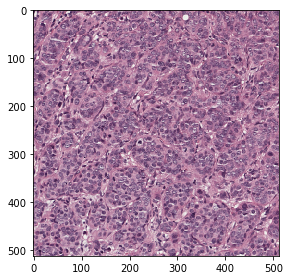

In [77]:
test_image = "Camelyon_Dataset/Cancer/Cancer_1.png"

image = io.imread(test_image)
io.imshow(image)

In [78]:
result = extract_features(test_image)
num_patch = len(result)
num_feature = len(result[0])
print(num_patch, num_feature)

64 294


In [81]:
result

[['Cancer_1_1',
  0.0,
  0.0,
  0.0,
  0.0,
  0.029296875,
  0.46240234375,
  0.463623046875,
  0.044677734375,
  2450.374735169493,
  38.0940148305085,
  0.025624158085941907,
  0.0002078807275208276,
  0.014418069479678186,
  0.02890914072009019,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  11.0,
  4054.0,
  31.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  201.0,
  2109.0,
  1635.0,
  151.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  127.0,
  3969.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  159.0,
  1902.0,
  1835.0,
  200.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  33.0,
  4019.0,
  44.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  